In [1]:
import pandas as pd
import numpy as np
from pandas import DataFrame, Series
import sklearn
import mglearn
import matplotlib.pyplot as plt
%matplotlib notebook

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [2]:
X, y  = mglearn.datasets.make_forge()
fix, ax = plt.subplots()
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
ax.legend(['Class 0', 'Class 1'])
ax.set_xlabel('First feature')
ax.set_ylabel('Second feature')

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function make_blobs is deprecated; Please import make_blobs directly from scikit-learn
  warnings.warn(msg, category=FutureWarning)


<IPython.core.display.Javascript object>

Text(0,0.5,'Second feature')

In [3]:
X, y = mglearn.datasets.make_wave(n_samples=40)
fig,ax=plt.subplots()
ax.plot(X, y, 'o')
ax.set_ylim(-3, 3)
ax.set_xlabel('Feature')
ax.set_ylabel('Target')


<IPython.core.display.Javascript object>

Text(0,0.5,'Target')

In [4]:
fig, ax = plt.subplots(1,1)
mglearn.plots.plot_knn_classification(n_neighbors=1)

<IPython.core.display.Javascript object>

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function make_blobs is deprecated; Please import make_blobs directly from scikit-learn
  warnings.warn(msg, category=FutureWarning)


In [5]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()
cancer.keys()

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [6]:
from sklearn.model_selection import train_test_split
data = cancer.data
target = cancer.target
X_train, X_test, Y_train, Y_test = train_test_split(data, target, random_state=66)


In [7]:
from sklearn.neighbors import KNeighborsClassifier

train_scores=[]
test_scores=[]
x=np.arange(1, 11)
for n_neighbors in range(1, 11):
    knn = KNeighborsClassifier(n_neighbors)
    knn.fit(X_train, Y_train)
    train_scores.append(knn.score(X_train, Y_train))
    test_scores.append(knn.score(X_test, Y_test))


fig, ax = plt.subplots(1,1)
ax.plot(x,train_scores, label='Training accuracy')
ax.plot(x,test_scores, label='Test accuracy')
ax.set_title('Breast cancer')
ax.set_xlabel("N neighbors")
ax.set_ylabel("Accuracy")
ax.legend()
    

<IPython.core.display.Javascript object>

In [8]:
fig,ax=plt.subplots(1,1)
mglearn.plots.plot_knn_regression(n_neighbors=1)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [9]:
from sklearn.neighbors import KNeighborsRegressor
X, y = mglearn.datasets.make_wave(n_samples=40)
X_train,X_test,Y_train,Y_test=train_test_split(X,y,random_state=0)

train_scores=[]
test_scores=[]
x=np.arange(1, 11)
for n_neighbors in range(1, 11):
    reg = KNeighborsRegressor(n_neighbors)
    reg.fit(X_train, Y_train)
    train_scores.append(reg.score(X_train, Y_train))
    test_scores.append(reg.score(X_test, Y_test))


fig, ax = plt.subplots(1,1)
ax.plot(x,train_scores, label='Training score')
ax.plot(x,test_scores, label='Test score')
ax.set_title('wave')
ax.set_xlabel("N neighbors")
ax.set_ylabel("Score")
ax.legend()
    

<IPython.core.display.Javascript object>

In [10]:
fig, axes=plt.subplots(3,1)
line = np.linspace(-3, 3, 1000).reshape(-1,1)
for n_neighbors, ax in zip([1, 3, 9], axes):
    reg = KNeighborsRegressor(n_neighbors=n_neighbors)
    reg.fit(X_train, Y_train)
    ax.plot(line, reg.predict(line), label='Model predictions')
    ax.plot(X_train, Y_train, '^', label='Training data/target')
    ax.plot(X_test, Y_test, 'v', label='Test data/target')
    ax.set_title("{n_neighbors} neighbor(s)\n train score: {train_score:.02f}, test score: {test_score:.02f}".format(
        n_neighbors=n_neighbors, 
        train_score=reg.score(X_train,Y_train),
        test_score=reg.score(X_test, Y_test)))
    ax.set_xlabel('Feature')
    ax.set_ylabel('Target')
axes[0].legend()
fig.set_size_inches(7, 8)
fig.subplots_adjust(hspace=0.6)

<IPython.core.display.Javascript object>

In [11]:
plt.figure()
mglearn.plots.plot_linear_regression_wave()

<IPython.core.display.Javascript object>

w[0]: 0.393906  b: -0.031804


<IPython.core.display.Javascript object>

In [12]:
from sklearn.linear_model import LinearRegression
X, y = mglearn.datasets.make_wave(n_samples=60)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
lr = LinearRegression().fit(X_train, y_train)
print("lr.coef_: %s" % lr.coef_)
print("lr.intercept_: %s" % lr.intercept_)
print('Training set score: %s' % lr.score(X_train, y_train))
print('Test set score: %s' % lr.score(X_test, y_test))

lr.coef_: [ 0.39390555]
lr.intercept_: -0.0318043430268
Training set score: 0.670089031508
Test set score: 0.659336859686


In [13]:
from sklearn.linear_model import LinearRegression
X, y = mglearn.datasets.load_extended_boston()
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
lr = LinearRegression().fit(X_train, y_train)
print('Training set score: %s' % lr.score(X_train, y_train))
print('Test set score: %s' % lr.score(X_test, y_test))

Training set score: 0.952051960903
Test set score: 0.607472195967


In [14]:
from sklearn.linear_model import Ridge
ridge = Ridge().fit(X_train, y_train)
print('Training set score: %s' % ridge.score(X_train, y_train))
print('Test set score: %s' % ridge.score(X_test, y_test))

Training set score: 0.885796658517
Test set score: 0.752768348174


In [15]:
fig, ax = plt.subplots(1,1)
for alpha, marker in zip([0.1,1,10], ['s', '^', 'v']):
    ridge = Ridge(alpha=alpha).fit(X_train, y_train)
    ax.plot(ridge.coef_, marker, label='Ridge alpha=%s'%alpha)
lr = LinearRegression().fit(X_train, y_train)
ax.plot(lr.coef_, 'o', label='LinearRegression')
ax.set_xlabel('Coefficient index')
ax.set_ylabel('Coefficient magnitude')
ax.hlines(0, 0, len(lr.coef_))
ax.set_ylim(-50, 50)
fig.set_size_inches(7, 8)
ax.legend()
    

<IPython.core.display.Javascript object>

In [16]:
fig, ax = plt.subplots(1,1)
alphas = np.logspace(-2, 0, 100)
test_scores = []
train_scores = []
for alpha in alphas:
    ridge = Ridge(alpha=alpha).fit(X_train, y_train)
    train_scores.append(ridge.score(X_train, y_train))
    test_scores.append(ridge.score(X_test, y_test))
ax.plot(alphas, train_scores, label='train score')
ax.plot(alphas, test_scores, label='test score')
ax.legend()
ax.set_xscale('log')

<IPython.core.display.Javascript object>

In [17]:
fig, ax = plt.subplots(1,1)
mglearn.plots.plot_ridge_n_samples()

<IPython.core.display.Javascript object>

In [18]:
from sklearn.linear_model import Lasso
lasso = Lasso().fit(X_train, y_train)
print("Training score: %s" % lasso.score(X_train, y_train))
print("Test score: %s" % lasso.score(X_test, y_test))
print("Number of features used: %d" % np.sum(lasso.coef_ != 0))

Training score: 0.293237689911
Test score: 0.209375032553
Number of features used: 4


In [19]:
fig, axes = plt.subplots(2,1)
alphas = np.logspace(-3, 0, 100)
test_scores = []
train_scores = []
features_used = []
for alpha in alphas:
    lasso = Lasso(alpha=alpha, max_iter=1000000).fit(X_train, y_train)
    train_scores.append(lasso.score(X_train, y_train))
    test_scores.append(lasso.score(X_test, y_test))
    features_used.append(np.sum(lasso.coef_!=0))
ax=axes[0]
ax.plot(alphas, train_scores, label='train score')
ax.plot(alphas, test_scores, label='test score')
ax.legend()
ax.set_xscale('log')
ax=axes[1]
ax.plot(alphas, features_used, label='Feature used')
ax.legend()
ax.set_xscale('log')

<IPython.core.display.Javascript object>

In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

X, y = mglearn.datasets.make_forge()
fig, axes=plt.subplots(2, 1)
for model, ax in zip([LogisticRegression(), LinearSVC()], axes):
    clf = model.fit(X, y)
    mglearn.plots.plot_2d_separator(clf, X, fill=False, eps=0.5, ax=ax, alpha=0.7)
    mglearn.discrete_scatter(X[:, 0], X[:, 1], y, ax=ax)
    ax.set_title(clf.__class__.__name__)
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    
axes[0].legend()
    

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function make_blobs is deprecated; Please import make_blobs directly from scikit-learn
  warnings.warn(msg, category=FutureWarning)


<IPython.core.display.Javascript object>

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [21]:
mglearn.plots.plot_linear_svc_regularization()

<IPython.core.display.Javascript object>

In [22]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()
X, y = cancer.data, cancer.target
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=0)
training_scores = []
test_scores = []
cs=np.logspace(-2,5,100)

for C in cs:
    logreg = LogisticRegression(C=C).fit(X_train, y_train)
    training_scores.append(logreg.score(X_train, y_train))
    test_scores.append(logreg.score(X_test, y_test))
fig, axes = plt.subplots(2, 1)
ax = axes[0]
ax.plot(cs, training_scores, label="training score")
ax.plot(cs, test_scores, label="test score")
ax.set_xlabel('C')
ax.set_ylabel('Accuracy')
ax.set_xscale('log')
ax.legend()
coefs=[]
cs=[0.001, 1, 100]
ax = axes[1]
styles=['o','^','v']
for C,style in zip(cs,styles):
    logreg = LogisticRegression(C=C).fit(X_train, y_train)
    ax.plot(logreg.coef_.T, style,label='C=%s'%C)
ax.set_xticks(range(X.shape[1]))
ax.set_xticklabels(cancer.feature_names, rotation=90)
fig.set_size_inches(8, 20)
ax.hlines(0, 0, X.shape[1])
ax.legend()
   



/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

<IPython.core.display.Javascript object>

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

<IPython.core.display.Javascript object>


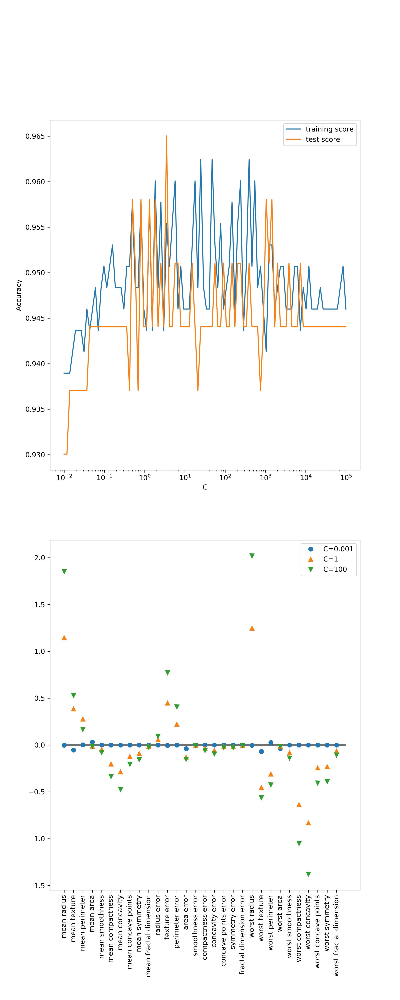

/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/fengp/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:939: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html.
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model

In [25]:

training_scores = []
test_scores = []
cs=np.logspace(-2,5,100)

for C in cs:
    logreg = LogisticRegression(C=C, penalty='l2').fit(X_train, y_train)
    training_scores.append(logreg.score(X_train, y_train))
    test_scores.append(logreg.score(X_test, y_test))
fig, axes = plt.subplots(2, 1)
ax = axes[0]
ax.plot(cs, training_scores, label="training score")
ax.plot(cs, test_scores, label="test score")
ax.set_xlabel('C')
ax.set_ylabel('Accuracy')
ax.set_xscale('log')
ax.legend()
coefs=[]
cs=[0.001, 1, 100]
ax = axes[1]
styles=['o','^','v']
for C,style in zip(cs,styles):
    logreg = LogisticRegression(C=C, penalty='l2').fit(X_train, y_train)
    ax.plot(logreg.coef_.T, style,label='C=%s'%C)
ax.set_xticks(range(X.shape[1]))
ax.set_xticklabels(cancer.feature_names, rotation=90)
fig.set_size_inches(8, 20)
ax.hlines(0, 0, X.shape[1])
ax.legend()
   



X.shape: (100, 2)
y.shape: (100,)


<IPython.core.display.Javascript object>


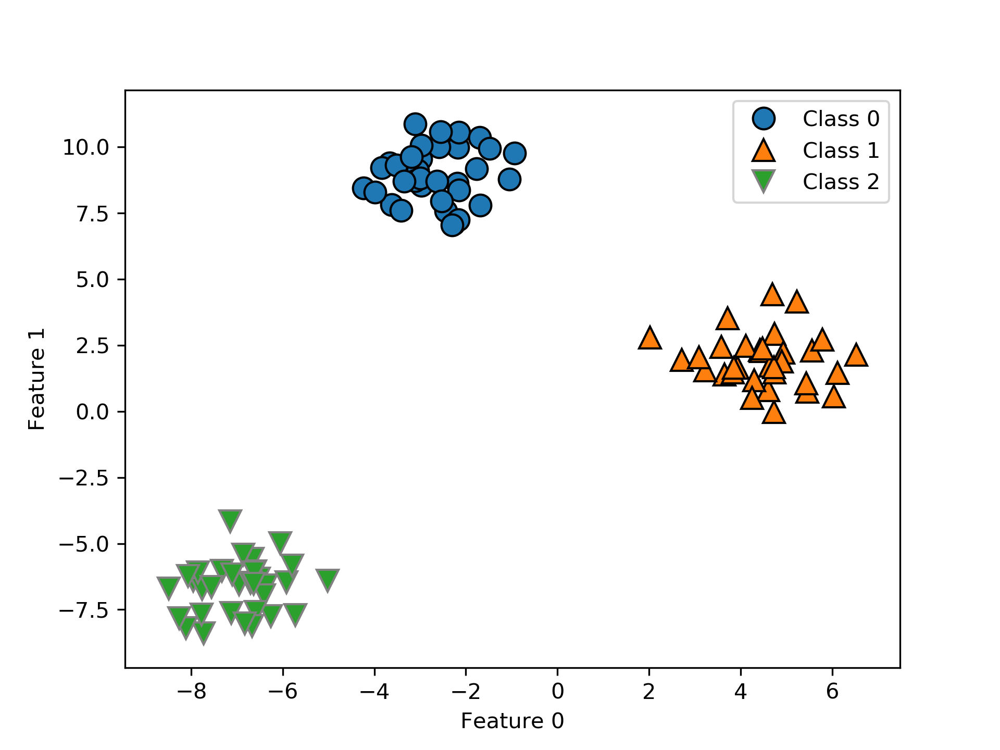

In [26]:
from sklearn.datasets import make_blobs
X, y = make_blobs(random_state=42)
print("X.shape: %s"%(X.shape,))
print("y.shape: %s"%(y.shape,))
fix, ax = plt.subplots()
mglearn.discrete_scatter(X[:,0],X[:,1],y)
ax.set_xlabel('Feature 0')
ax.set_ylabel('Feature 1')
ax.legend(['Class 0', 'Class 1', 'Class 2'])

In [27]:
linear_svm = LinearSVC().fit(X, y)
print("Coefficient shape: ", linear_svm.coef_.shape)
print("Intercep shape: ", linear_svm.intercept_.shape)

Coefficient shape:  (3, 2)
Intercep shape:  (3,)


<IPython.core.display.Javascript object>


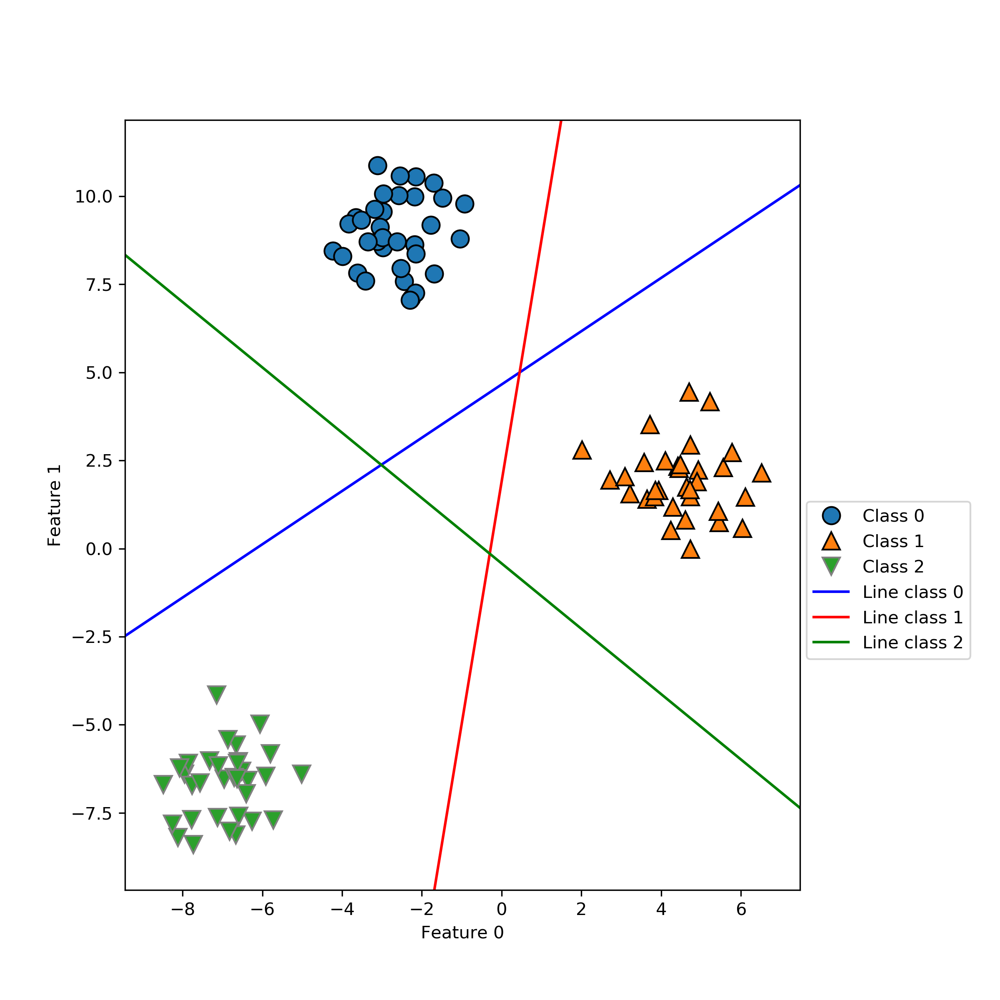

In [28]:
fig, ax = plt.subplots()
mglearn.discrete_scatter(X[:,0],X[:, 1], y)
line = np.linspace(-15, 15)
for coef, intercept, color in zip(linear_svm.coef_, linear_svm.intercept_, ['b', 'r', 'g']):
    ax.plot(line, -(line * coef[0]+intercept)/coef[1],c=color)
ax.set_xlabel('Feature 0')
ax.set_ylabel('Feature 1')
fig.set_size_inches(8, 8)

ax.margins(0)
ax.legend(['Class 0', 'Class 1', 'Class 2', 'Line class 0', 'Line class 1', 'Line class 2'], loc=(1.01, 0.3))
fig.subplots_adjust(right=0.8)

/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


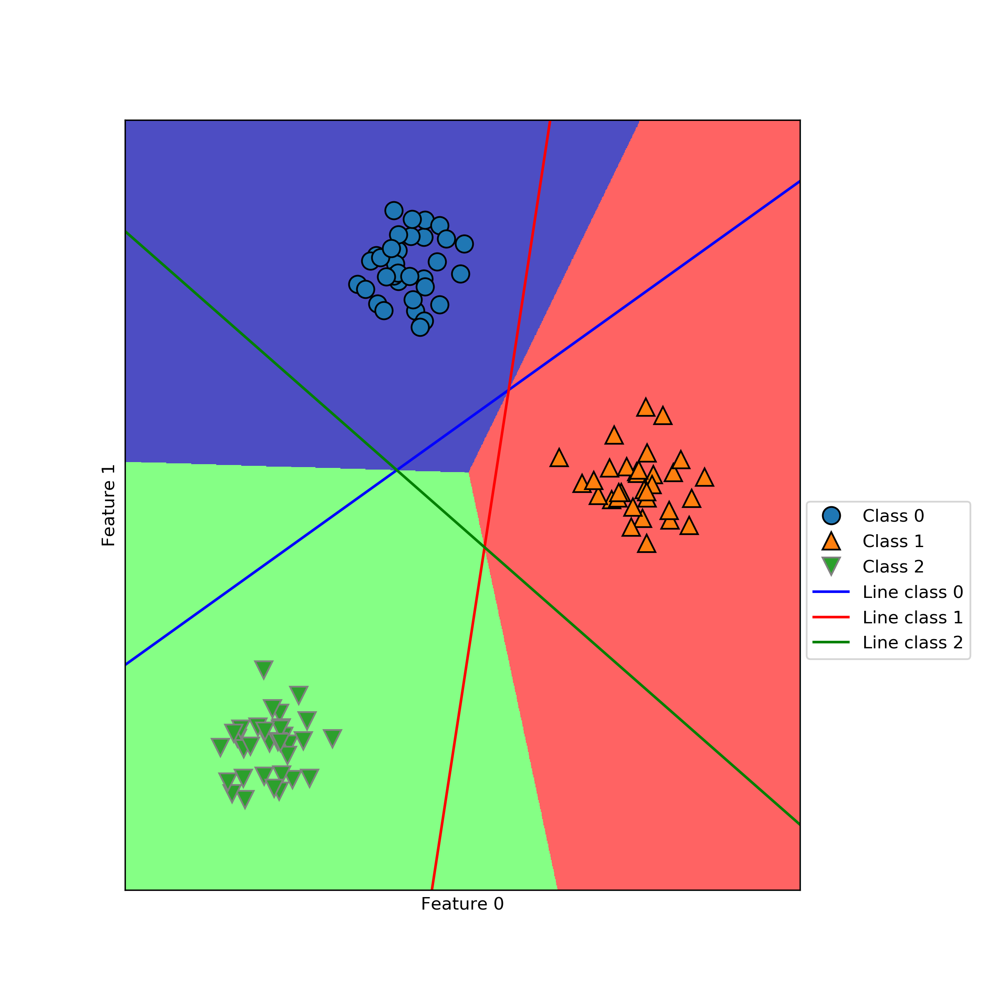

In [29]:
fig, ax = plt.subplots()
mglearn.plots.plot_2d_classification(linear_svm, X, fill=True, alpha=0.7)
mglearn.discrete_scatter(X[:, 0], X[:, 1], y)
line = np.linspace(-15, 15, 100)

for coef, intercept, color in zip(linear_svm.coef_, linear_svm.intercept_, ['b', 'r', 'g']):
    ax.plot(line, -(line * coef[0]+intercept)/coef[1],c=color)
ax.set_xlabel('Feature 0')
ax.set_ylabel('Feature 1')
fig.set_size_inches(8, 8)

ax.margins(0)
ax.legend(['Class 0', 'Class 1', 'Class 2', 'Line class 0', 'Line class 1', 'Line class 2'], loc=(1.01, 0.3))
fig.subplots_adjust(right=0.8)


### Decision Tree

/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


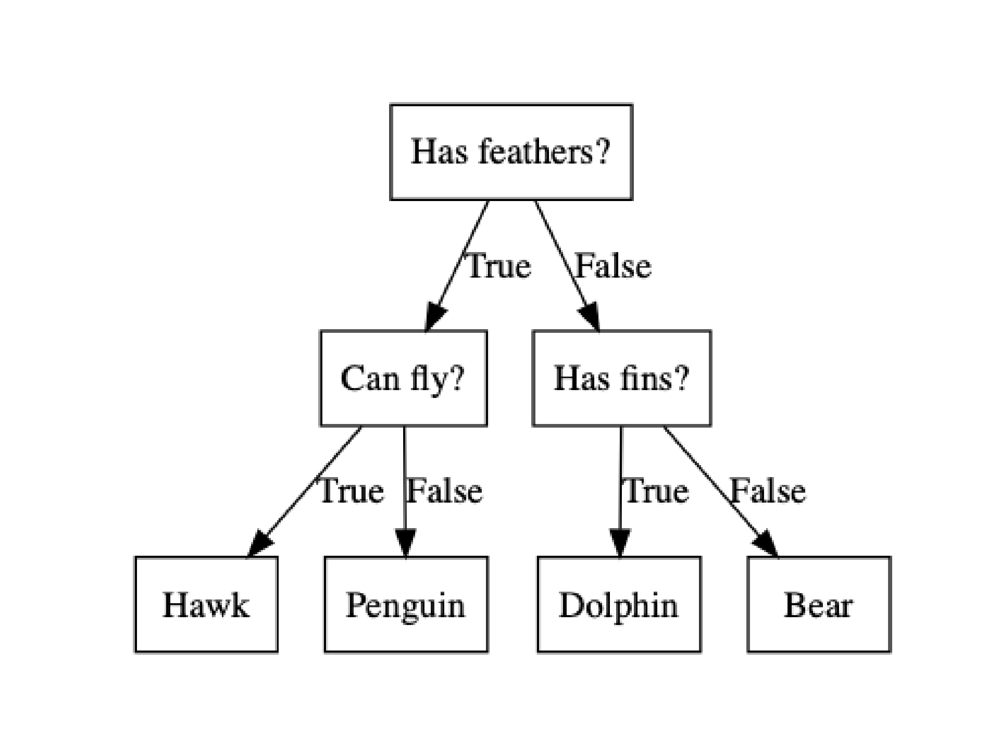

In [30]:
fig, ax = plt.subplots()
mglearn.plots.plot_animal_tree()

In [31]:
from sklearn.tree import DecisionTreeClassifier
cancer = load_breast_cancer()
data = cancer.data
target = cancer.target
X_train, X_test, y_train, y_test = train_test_split(data, target, random_state=42)
tree = DecisionTreeClassifier(random_state=0)
tree.fit(X_train, y_train)
print("Accuracy on training set: ", tree.score(X_train, y_train))
print("Accuracy on test set: ", tree.score(X_test, y_test))

Accuracy on training set:  1.0
Accuracy on test set:  0.93006993007


/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


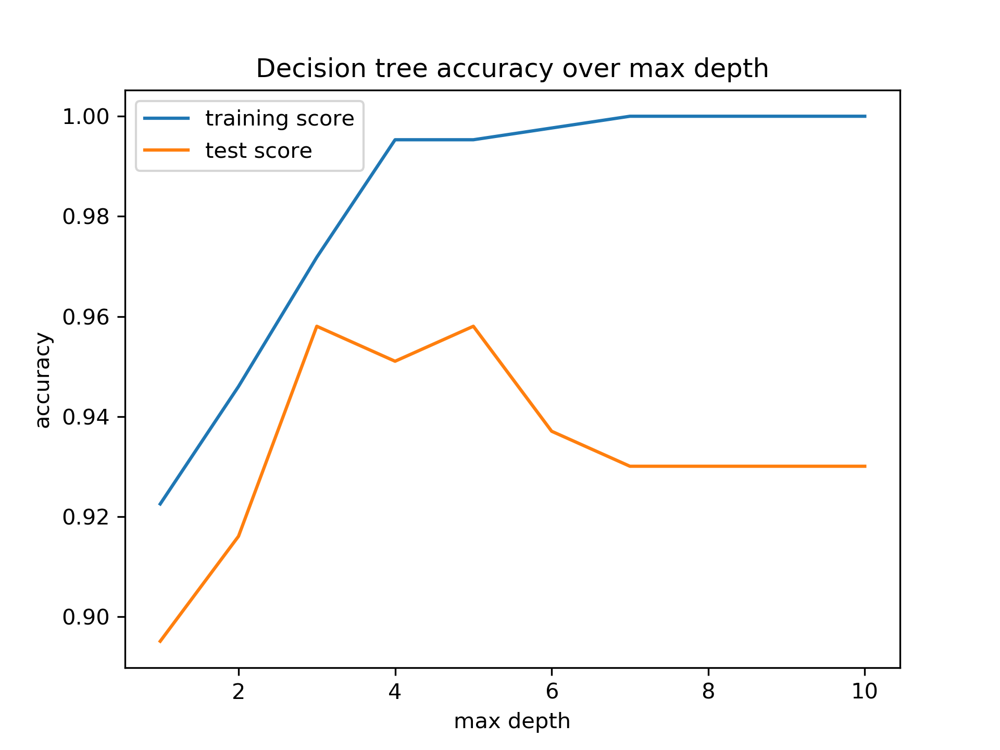

In [32]:
training_scores=[]
test_scores=[]
depths = list(range(1,11))
for depth in depths:
    tree = DecisionTreeClassifier(max_depth=depth, random_state=0)
    tree.fit(X_train, y_train)
    training_scores.append(tree.score(X_train, y_train))
    test_scores.append(tree.score(X_test, y_test))
fig, ax = plt.subplots()
ax.plot(depths, training_scores, label='training score')
ax.plot(depths, test_scores, label='test score')
ax.set_xlabel('max depth')
ax.set_ylabel('accuracy')
ax.set_title('Decision tree accuracy over max depth')
ax.legend()
    

In [33]:
from sklearn.tree import export_graphviz
tree = DecisionTreeClassifier(max_depth=4, random_state=0)
tree.fit(X_train, y_train)
export_graphviz(tree ,out_file='tree.dot', class_names=['maligant', 'benign'], feature_names=cancer.feature_names, impurity=False, filled=True)

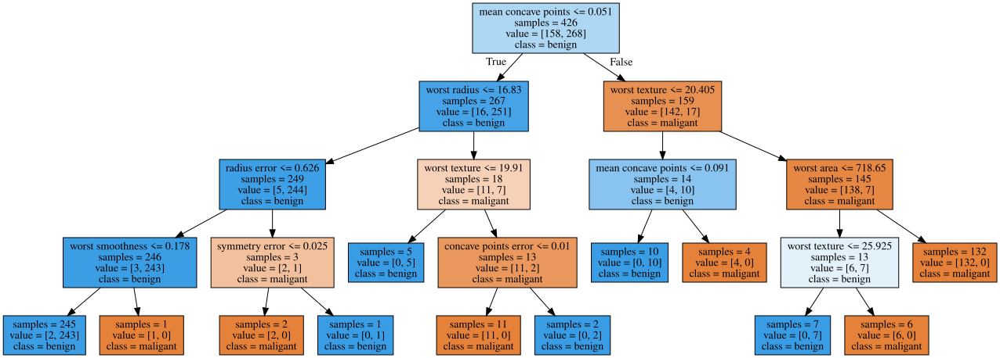

In [34]:
import graphviz
with open('tree.dot') as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


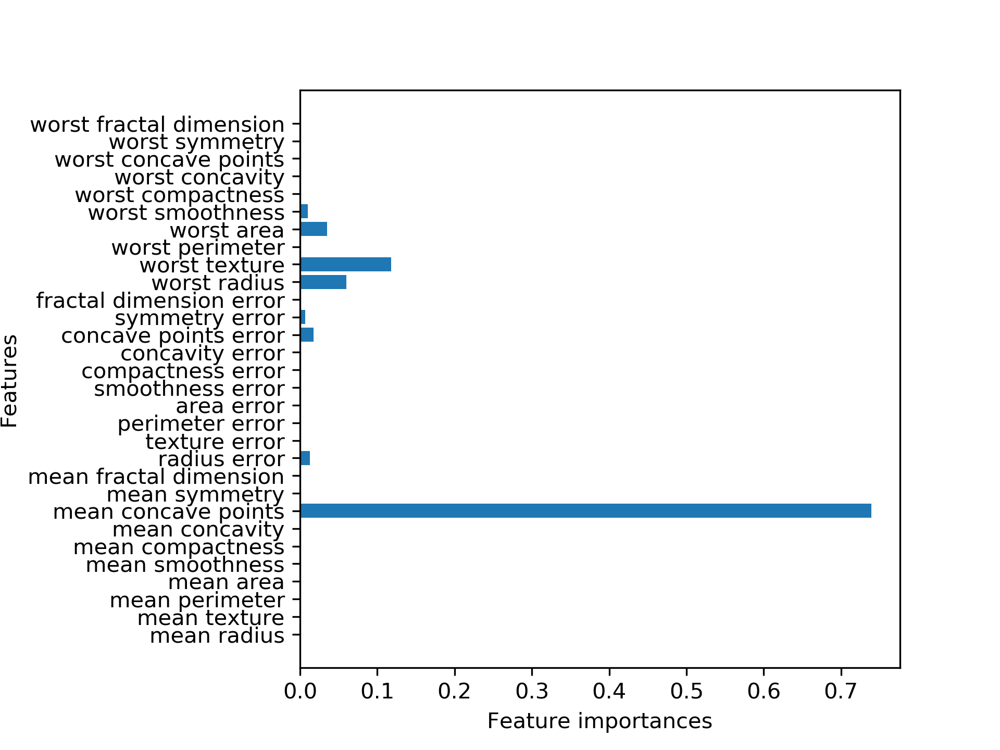

In [35]:
def plot_feature_importances(tree, feature_names, ax):
    n_features = len(tree.feature_importances_)
    ax.barh(range(n_features), tree.feature_importances_, align='center')
    ax.set_yticks(range(n_features))
    ax.set_yticklabels(feature_names)
    ax.set_ylabel('Features')
    ax.set_xlabel('Feature importances')
fig, ax = plt.subplots()
plot_feature_importances(tree, cancer.feature_names, ax)
fig.subplots_adjust(left=0.3)


/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


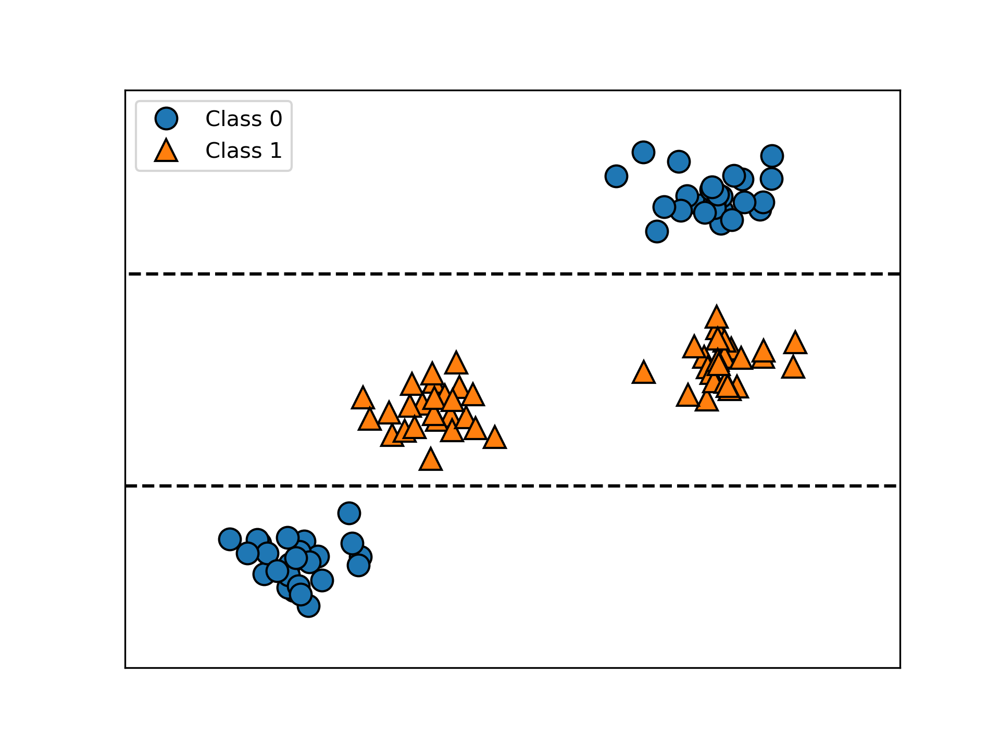

Feature importances: [ 0.  1.]
<class 'graphviz.files.Source'>


In [36]:
import mglearn
tree = mglearn.plots.plot_tree_not_monotone()
print(type(tree))

In [37]:
ram_prices = pd.read_csv("../data/ram_price.csv")
ram_prices

,Unnamed: 0,date,price
0,0,1957.00,4.110418e+08
1,1,1959.00,6.794772e+07
2,2,1960.00,5.242880e+06
3,3,1965.00,2.642412e+06
4,4,1970.00,7.340030e+05
...,...,...,...
328,328,2015.58,4.500000e-03
329,329,2015.67,4.300000e-03
330,330,2015.75,4.200000e-03
331,331,2015.83,3.800000e-03


/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


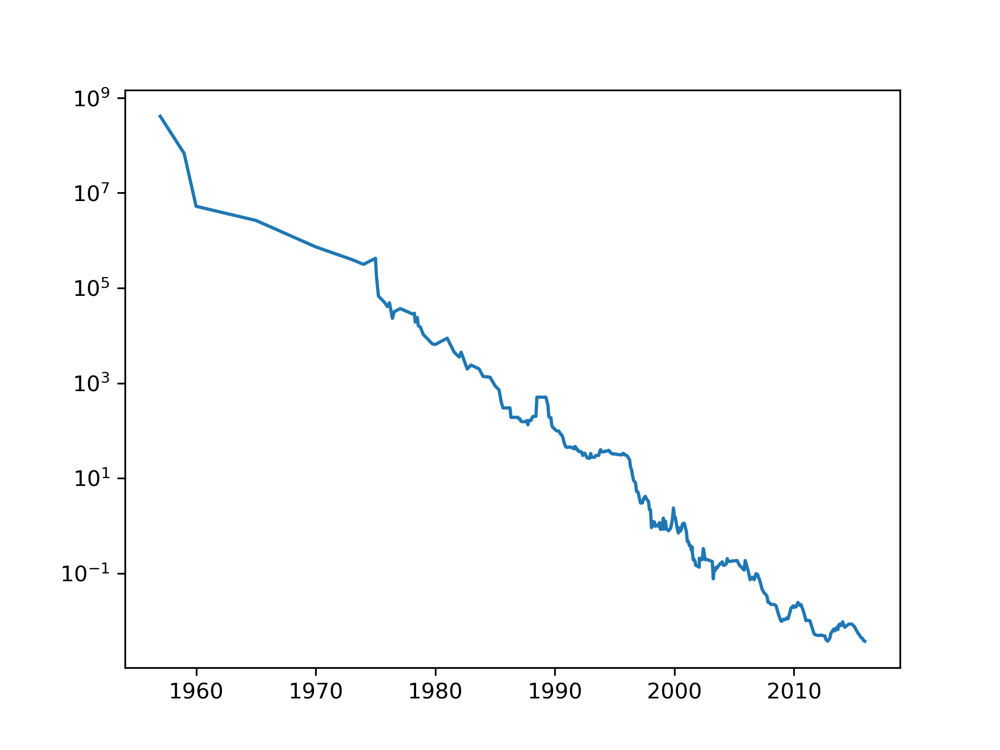

In [38]:
fig, ax = plt.subplots()
ax.semilogy(ram_prices.date, ram_prices.price)

In [39]:
from sklearn.tree import DecisionTreeRegressor
data_train = ram_prices[ram_prices.date<2000]
data_test = ram_prices[ram_prices.date>=2000]

In [40]:
X_train = data_train.date[:, np.newaxis]
y_train = np.log(data_train.price)
print('X_train shape: ', X_train.shape)
print('Y_train shape: ', y_train.shape)

X_train shape:  (202, 1)
Y_train shape:  (202,)


In [41]:
tree = DecisionTreeRegressor().fit(X_train, y_train)
line_reg = LinearRegression().fit(X_train, y_train)

In [42]:
X_all = ram_prices.date[:, np.newaxis]
tree_pred = tree.predict(X_all)
line_pred = line_reg.predict(X_all)
tree_prices = np.exp(tree_pred)
line_prices = np.exp(line_pred)

/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


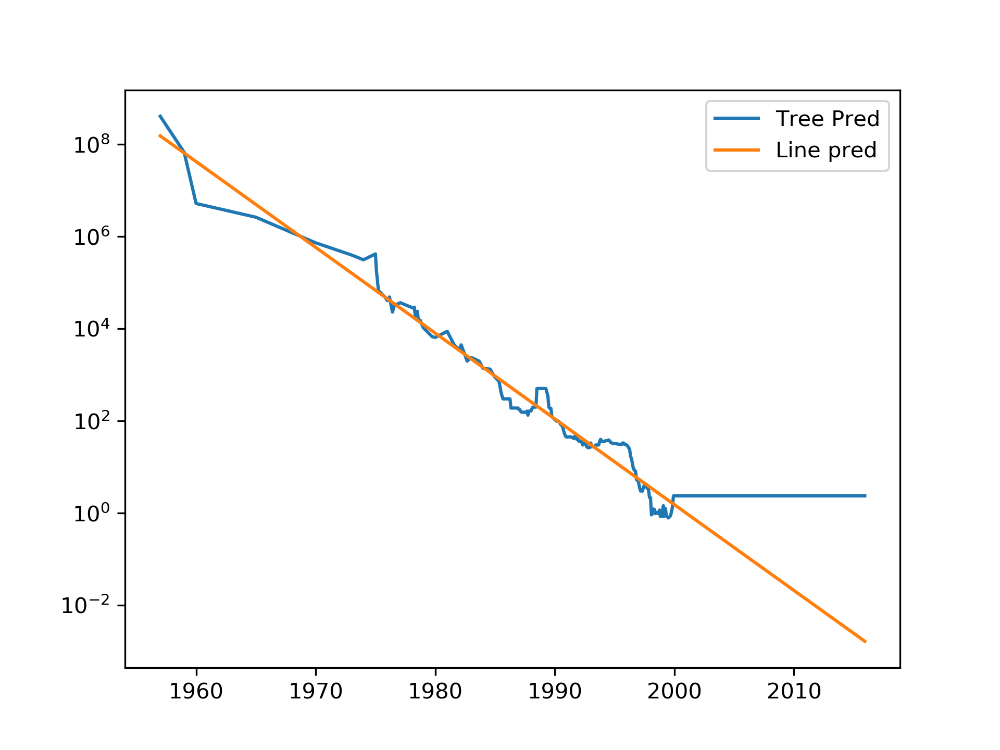

In [43]:
fix, ax = plt.subplots()
ax.semilogy(ram_prices.date, tree_prices, label='Tree Pred')
ax.semilogy(ram_prices.date, line_prices, label='Line pred')
#ax.semilogy(ram_prices.date, ram_prices.price, label='Real price')
ax.legend()

In [44]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_moons
X, y = make_moons(n_samples=100, noise=0.25, random_state=3)
print("X.shape: ", X.shape)
print("y.shape: ", y.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

X.shape:  (100, 2)
y.shape:  (100,)


In [45]:
forest = RandomForestClassifier(n_estimators=5, random_state=2)
forest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=5,
                       n_jobs=None, oob_score=False, random_state=2, verbose=0,
                       warm_start=False)

/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


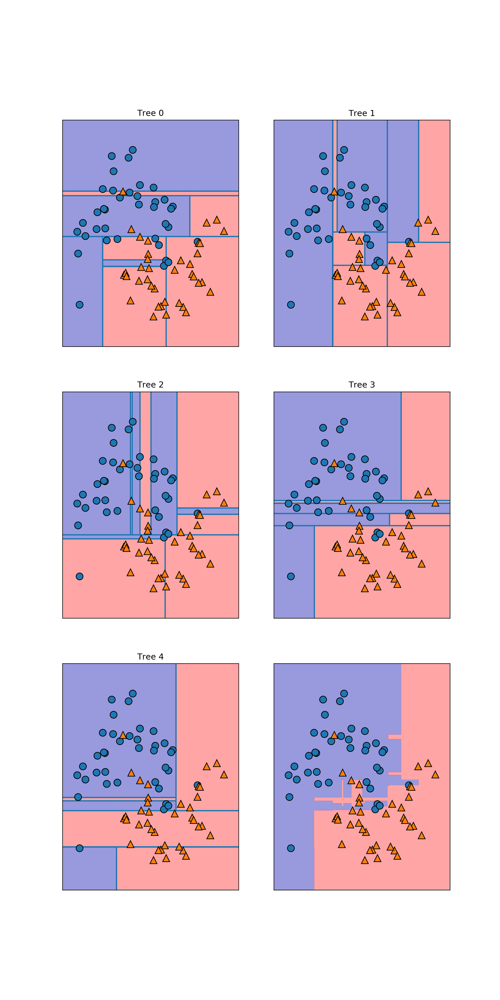

In [46]:
fig, axes = plt.subplots(3, 2, figsize=(10, 20))
for i, (ax, tree) in enumerate(zip(axes.ravel(), forest.estimators_)):
    ax.set_title("Tree %d" % i)
    mglearn.plots.plot_tree_partition(X_train, y_train, tree, ax=ax)
ax = axes[-1,-1]
mglearn.plots.plot_2d_separator(forest, X_train, fill=True, ax=ax, alpha=.4)
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)

In [47]:
X_train, X_test, y_train, y_test = train_test_split(cancer.data, cancer.target)
forest = RandomForestClassifier(n_estimators=100).fit(X_train, y_train)
print("Training score: ", forest.score(X_train, y_train))
print("Test score: ", forest.score(X_test, y_test))
print("Forest: ", forest)

Training score:  1.0
Test score:  0.951048951049
Forest:  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


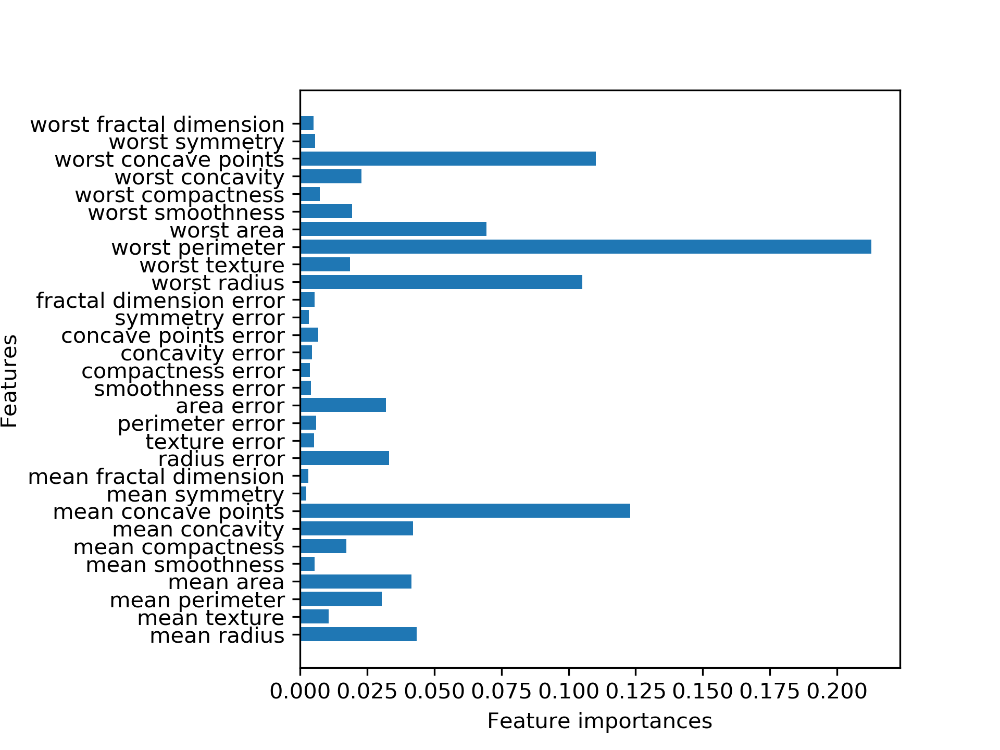

In [48]:
fig, ax = plt.subplots()
plot_feature_importances(forest, cancer.feature_names, ax)
fig.subplots_adjust(left=0.3)

In [62]:
from sklearn.ensemble import GradientBoostingClassifier
gbrt = GradientBoostingClassifier().fit(X_train, y_train)
print("Training score: ", gbrt.score(X_train, y_train))
print("Test score: ", gbrt.score(X_test, y_test))
print("Gbrt: ", gbrt)

Training score:  1.0
Test score:  0.951048951049
Gbrt:  GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


In [81]:
from sklearn.ensemble import GradientBoostingClassifier
max_test_score = -1
max_test_params = ()
for max_depth in range(1, 10):
    gbrt = GradientBoostingClassifier(max_depth=max_depth, random_state=0, subsample=0.8).fit(X_train, y_train)
    print("Max depth: ", max_depth)
    print("Learning rate: ", learning_rate)
    print("Training score: ", gbrt.score(X_train, y_train))
    test_score = gbrt.score(X_test, y_test)
    print("Test score: ", test_score)
    print("Gbrt: ", gbrt)
    if test_score > max_test_score:
        max_test_score = test_score
        max_test_params = max_depth
print("Max test score: ", max_test_score)
print("Max test params: ", max_test_params)


Max depth:  1
Learning rate:  1
Training score:  0.995305164319
Test score:  0.937062937063
Gbrt:  GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=1,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=0, subsample=0.8, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
Max depth:  2
Learning rate:  1
Training score:  1.0
Test score:  0.958041958042
Gbrt:  GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate

In [90]:
from sklearn.model_selection import GridSearchCV
param_test = {"n_estimators":list(range(20, 101, 10))}
search = GridSearchCV(estimator=GradientBoostingClassifier(learning_rate=0.1), param_grid=param_test)
search.fit(X_train, y_train)
search.best_params_, search.best_score_, search.cv_results_

({'n_estimators': 70},
 0.94834473324213397,
 {'mean_fit_time': array([ 0.04302149,  0.06167369,  0.08132768,  0.10143433,  0.12512145,
          0.14905272,  0.16363959,  0.19511123,  0.20339851]),
  'mean_score_time': array([ 0.00040455,  0.00042005,  0.00037928,  0.00038052,  0.00046415,
          0.00053887,  0.00045681,  0.00053701,  0.00046773]),
  'mean_test_score': array([ 0.93198358,  0.93666211,  0.93666211,  0.94136799,  0.94134063,
          0.94834473,  0.94599179,  0.94599179,  0.94599179]),
  'param_n_estimators': masked_array(data = [20 30 40 50 60 70 80 90 100],
               mask = [False False False False False False False False False],
         fill_value = ?),
  'params': [{'n_estimators': 20},
   {'n_estimators': 30},
   {'n_estimators': 40},
   {'n_estimators': 50},
   {'n_estimators': 60},
   {'n_estimators': 70},
   {'n_estimators': 80},
   {'n_estimators': 90},
   {'n_estimators': 100}],
  'rank_test_score': array([9, 7, 7, 5, 6, 1, 2, 2, 2], dtype=int32),
  

In [91]:

param_test2 = {'max_depth':range(3,14,1), 'min_samples_split':range(2,21,2)}
search = GridSearchCV(estimator=GradientBoostingClassifier(learning_rate=0.1, n_estimators=70), param_grid=param_test2)
search.fit(X_train, y_train)
search.best_params_, search.best_score_, search.cv_results_

({'max_depth': 7, 'min_samples_split': 14},
 0.95310533515731888,
 {'mean_fit_time': array([ 0.14521914,  0.14443316,  0.14400234,  0.14572701,  0.14289541,
          0.14132071,  0.14489841,  0.14269395,  0.14393802,  0.14373574,
          0.18024974,  0.18044529,  0.17976556,  0.18088942,  0.18702979,
          0.18398342,  0.17874875,  0.17820287,  0.17791767,  0.17730083,
          0.17873764,  0.18897467,  0.197506  ,  0.206598  ,  0.20529981,
          0.21130023,  0.21422648,  0.21328597,  0.21405721,  0.21220484,
          0.18585663,  0.18017979,  0.19966536,  0.22103624,  0.22491374,
          0.23303776,  0.24169946,  0.24600382,  0.24264035,  0.24241562,
          0.18741221,  0.19333606,  0.2061285 ,  0.2281888 ,  0.2353333 ,
          0.2596601 ,  0.2662075 ,  0.27260437,  0.27211642,  0.27287683,
          0.18735623,  0.18799915,  0.20608201,  0.23718581,  0.24127455,
          0.27464986,  0.28681459,  0.29700723,  0.28436184,  0.28960762,
          0.18764324,  0.1938

In [103]:

gbrt=GradientBoostingClassifier(learning_rate=0.1, n_estimators=100, max_depth=3, min_samples_split=14)
gbrt.fit(X_train, y_train)
print("Training score: ", gbrt.score(X_train, y_train))
print("Test score: ", gbrt.score(X_test, y_test))
print("Gbrt: ", gbrt)

Training score:  1.0
Test score:  0.944055944056
Gbrt:  GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=14,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


In [84]:
GridSearchCV?

In [80]:
print("X_train: ", X_train.shape)

X_train:  (426, 30)


/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


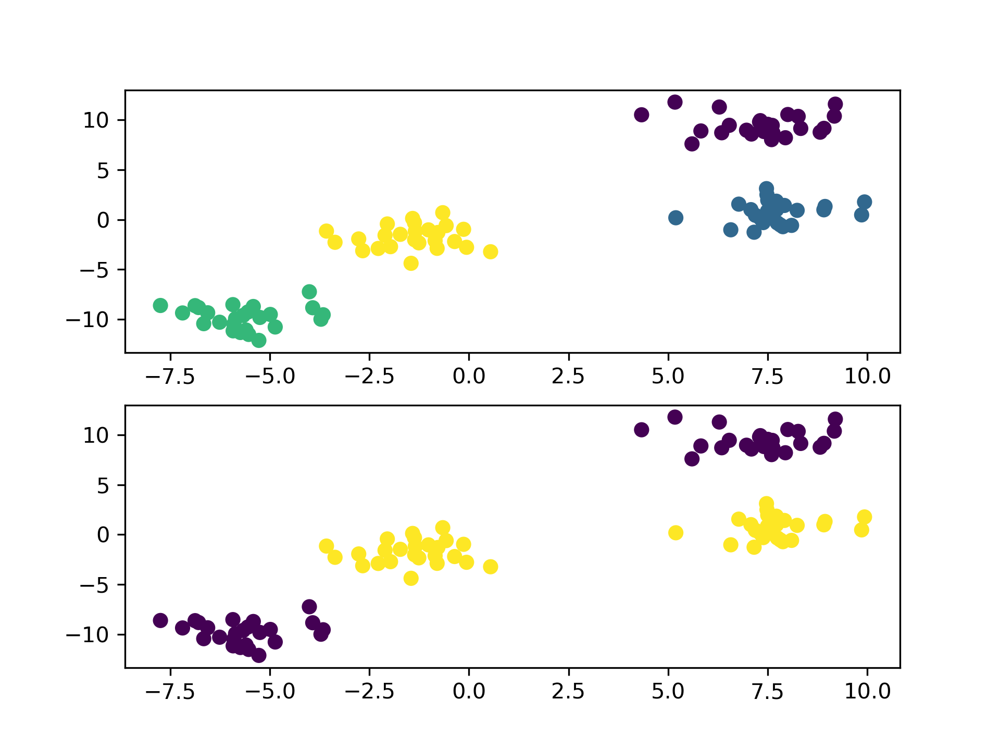

((100, 2), (100,))

In [111]:
X, y = make_blobs(centers=4, random_state=8)
fig, axes = plt.subplots(2, 1)
ax = axes[0]
ax.scatter(X[:, 0], X[:, 1], c=y)

ax=axes[1]
y = y % 2
ax.scatter(X[:, 0], X[:, 1], c=y)
X.shape, y.shape

In [124]:
from sklearn.svm import LinearSVC
svm = LinearSVC(max_iter=10000).fit(X, y)
svm.coef_,svm.intercept_


(array([[ 0.12606393, -0.09176321]]), array([-0.28169857]))

/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


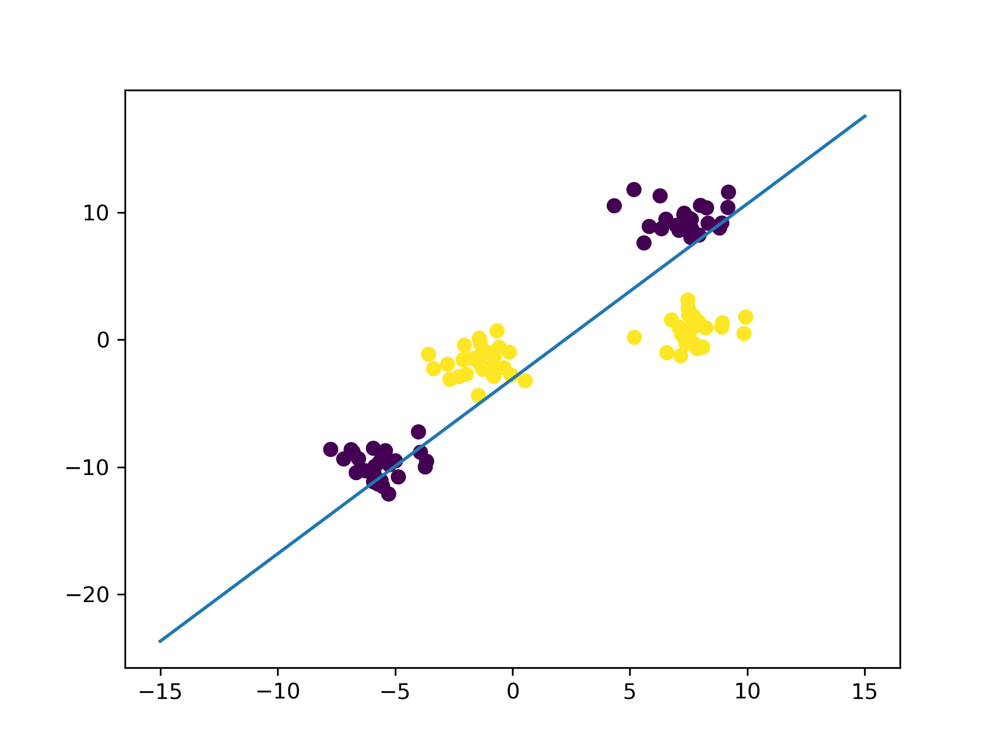

In [127]:
fig, ax = plt.subplots()
xs = np.linspace(-15, 15, 100).reshape(-1, 1)
ax.scatter(X[:,0], X[:,1], c=y)
for coef, intercept in zip(svm.coef_, svm.intercept_):    
    ax.plot(xs, -(coef[0]*xs+intercept)/coef[1])

/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


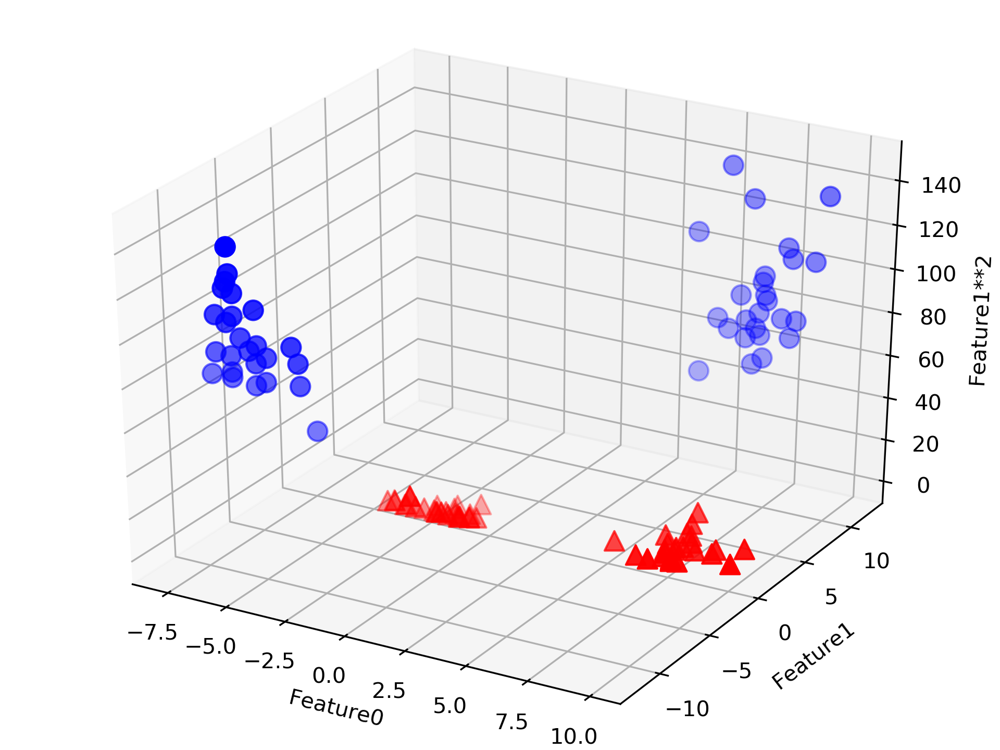

Text(0.5,0,'Feature1**2')

In [169]:
X_new = np.hstack([X, X[:, 1:]**2])
from mpl_toolkits.mplot3d import Axes3D, axes3d
fig, axes=plt.figure()
ax=Axes3D(fig)
mask=y==0
ax.scatter(X_new[mask, 0], X_new[mask, 1], X_new[mask, 2], c='b', s=80)
mask=~mask
ax.scatter(X_new[mask, 0], X_new[mask, 1], X_new[mask, 2], c='r', s=80,marker='^')
ax.set_xlabel("Feature0")
ax.set_ylabel("Feature1")
ax.set_zlabel("Feature1**2")


/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


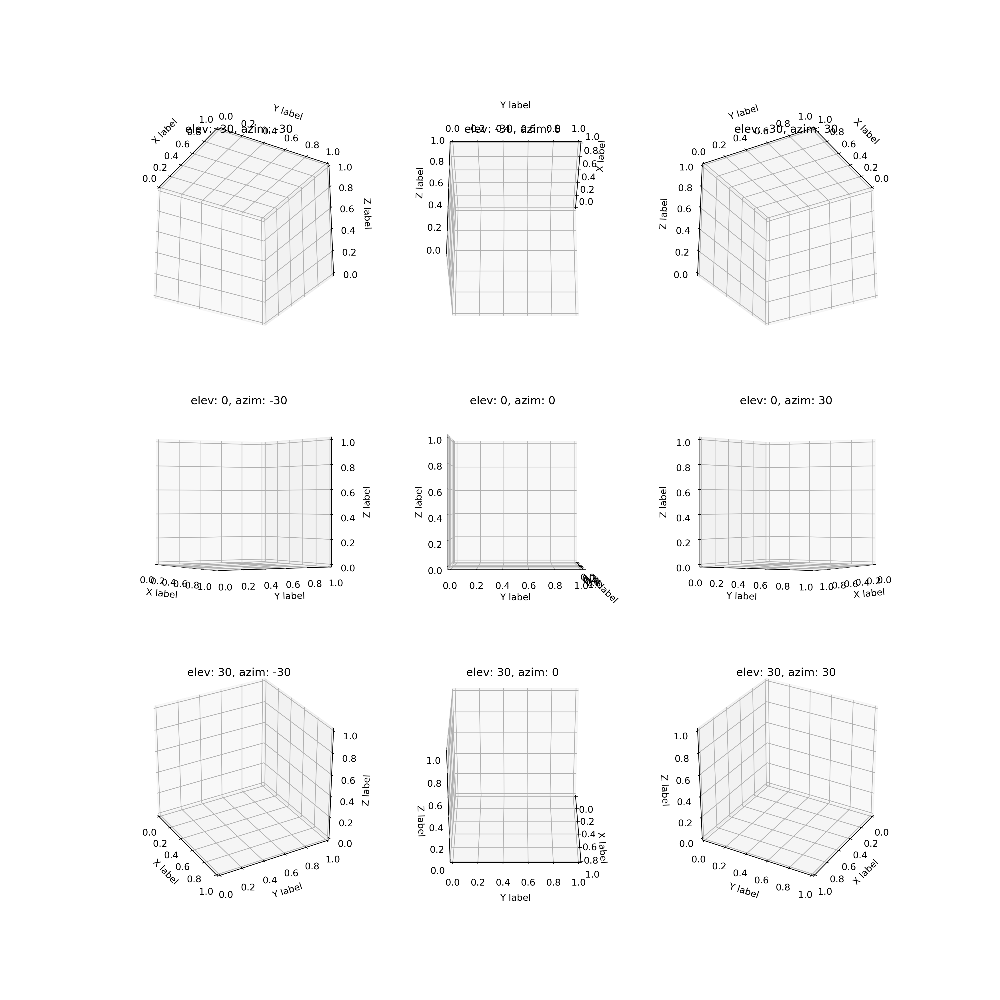

1 1 1
1 2 2
1 3 3
2 1 4
2 2 5
2 3 6
3 1 7
3 2 8
3 3 9


In [192]:
fig = plt.figure()
elevs = np.arange(-30, 31, 30)
azims = np.arange(-30, 31, 30)
h=len(elevs)
w=len(azims)
for y, elev in enumerate(elevs):
    for x, azim in enumerate(azims):
        print(y+1, x+1, y*w+x+1)
        ax = fig.add_subplot(h, w, y*w+x+1, projection="3d")
        ax.elev = elev
        ax.azim = azim
        ax.set_xlabel('X label')
        ax.set_ylabel("Y label")
        ax.set_zlabel("Z label")
       
        ax.set_title(F"elev: {elev}, azim: {azim}")
fig.set_size_inches(15, 15)

/Users/fengp/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


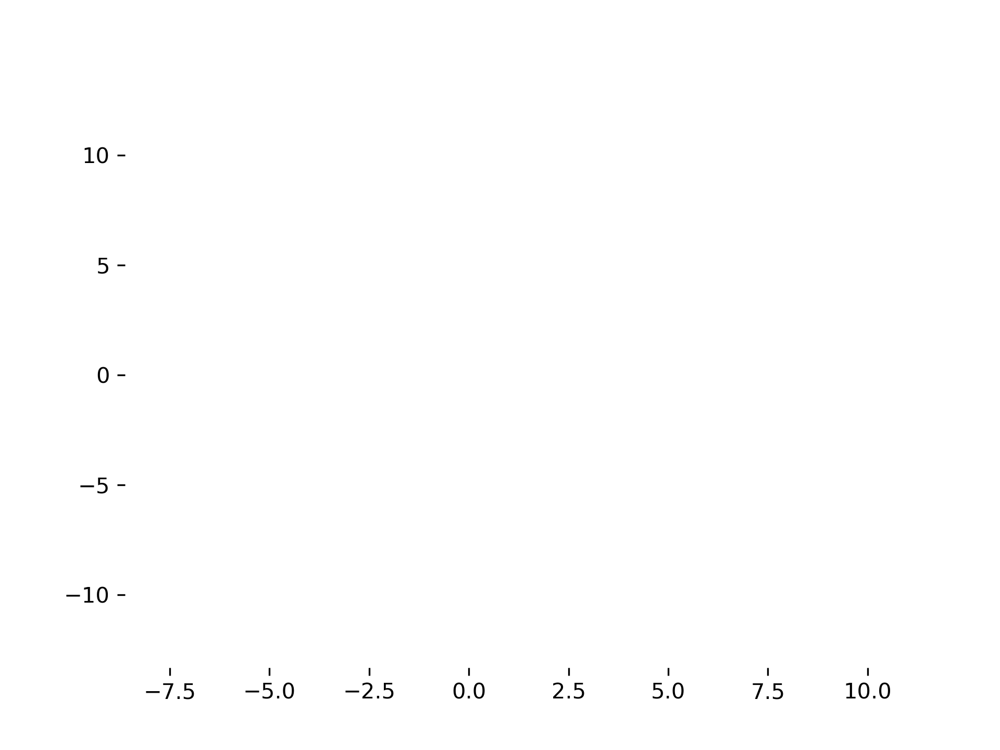

In [194]:
fig, ax = plt.subplots()
ax.plot(X[:, 0], X[:, 1], c=y)